In [ ]:
import numpy as np 
import scipy.io
import matplotlib.pyplot as plt
import os


# Traverse the directory 'EEG_Data' to find all files within it
file_names=[]
for dirname, _, filenames in os.walk('EEG_Data'):
    for filename in filenames:
        file_names.append(os.path.join(dirname, filename))

print(file_names)

['EEG_Data/eeg_record34.mat', 'EEG_Data/eeg_record30.mat', 'EEG_Data/eeg_record21.mat', 'EEG_Data/eeg_record31.mat', 'EEG_Data/eeg_record32.mat', 'EEG_Data/eeg_record18.mat', 'EEG_Data/eeg_record28.mat', 'EEG_Data/eeg_record6.mat', 'EEG_Data/eeg_record17.mat', 'EEG_Data/eeg_record16.mat', 'EEG_Data/eeg_record27.mat', 'EEG_Data/eeg_record13.mat', 'EEG_Data/eeg_record29.mat', 'EEG_Data/eeg_record23.mat', 'EEG_Data/eeg_record8.mat', 'EEG_Data/eeg_record11.mat', 'EEG_Data/eeg_record7.mat', 'EEG_Data/eeg_record10.mat', 'EEG_Data/eeg_record24.mat', 'EEG_Data/eeg_record33.mat', 'EEG_Data/eeg_record12.mat', 'EEG_Data/eeg_record5.mat', 'EEG_Data/eeg_record3.mat', 'EEG_Data/eeg_record25.mat', 'EEG_Data/eeg_record26.mat', 'EEG_Data/eeg_record22.mat', 'EEG_Data/eeg_record9.mat', 'EEG_Data/eeg_record1.mat', 'EEG_Data/eeg_record19.mat', 'EEG_Data/eeg_record4.mat', 'EEG_Data/eeg_record15.mat', 'EEG_Data/eeg_record14.mat', 'EEG_Data/eeg_record20.mat', 'EEG_Data/eeg_record2.mat']


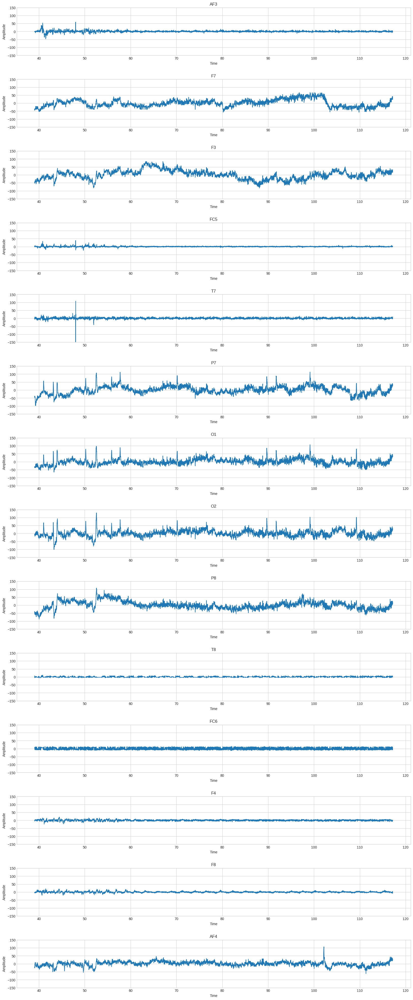

In [3]:
plt.style.use('seaborn-v0_8-whitegrid')

# There are 14 channels, the first one is in position 3
fig, ax = plt.subplots(14, 1)
fig.set_figwidth(20)
fig.set_figheight(50)
fig.subplots_adjust(hspace=0.5)

mat = scipy.io.loadmat(file_names[1])  # eeg_record25.mat
data = mat['o']['data'][0, 0]
FS = mat['o']['sampFreq'][0][0][0][0]
channels = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']

# Create a time vector in seconds for the selected samples
t = np.arange(5000, 15000) / FS

for i in range(14):
    segment = data[5000:15000, i + 3]
    data_ave = segment - np.mean(segment)
    ax[i].plot(t, data_ave)
    ax[i].set_title(channels[i])
    ax[i].set_xlabel('Time')
    ax[i].set_ylabel('Amplitude')
    ax[i].set_ylim(-150, 150)
    ax[i].grid(True)


According to the previous plots, F7, F3, P7, O1, O2, P8, AF4 are useful channels, so those will be the one kept for the implementation.

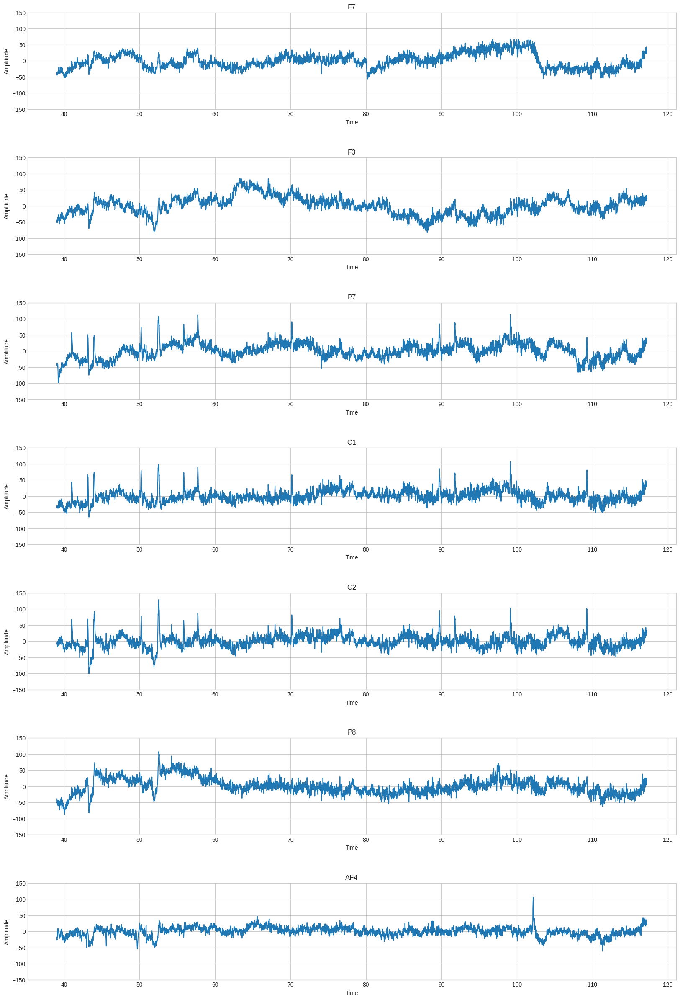

In [4]:
# Define the useful channels (indices in the data) and their corresponding names.
useful_channels = [4, 5, 8, 9, 10, 11, 16]  # F7,F3,P7,O1,O2,P8,AF4

fig, ax = plt.subplots(7, 1, sharex=True)
fig.set_figwidth(20)
fig.set_figheight(30)
fig.subplots_adjust(hspace=0.5)

# Create a time vector in seconds for the selected samples
t = np.arange(5000, 15000) / FS

for j, i in enumerate(useful_channels):
    # For the channel index, adjust the title using channels[i-3].
    segment = data[5000:15000, i]
    data_ave = segment - np.mean(segment)
    ax[j].plot(t, data_ave)
    ax[j].set_title(channels[i - 3])
    ax[j].set_xlabel('Time')
    ax[j].set_ylabel('Amplitude')
    ax[j].set_ylim(-150, 150)
    ax[j].tick_params(axis='x', labelbottom=True)
    ax[j].grid(True)

plt.show()

The states seem to be defined arbitrarily as 10 min adjacent periods.
1st 10 minutes of data(t=0 min to t=10 min) is for "focussed" state
2nd 10 minutes of data(t=10 min to t=20 min) is for "unfocussed" state
Remaining data(t=20 min to onwards) is for "Drowsed" state

In [5]:
# Samples per state = 128 samples/sec x 60 sec/min x 10 min
marker=128*60*10

useful_file_index = [3,4,5,6,7,10,11,12,13,14,17,18,19,20,21,24,25,26,27,31,32,33,34]

# Number of usefull chanels
chan_num=7

trail_names=[]

# The processed data will be stored here
data_focus={}
data_unfocus={}
data_drowsy={}

# These will keep the raw data
focus={}
unfocus={}
drowsy={}

i=1
# Iterates over the list of filenames
for index,filename in enumerate(filenames):
    # Checks if the file index is in the list of useful file indices
    if int(filename.split('d')[1].split('.')[0]) in useful_file_index:
        # Loads the MATLAB file and extracts the trial name
        mat = scipy.io.loadmat(file_names[index])
        trail_names.append(filename.split('.')[0])

        # Extracts and stores data segments for focused, unfocused, and drowsy states from the useful channels
        data_focus[trail_names[-1]]=mat['o']['data'][0,0][0:marker,useful_channels].copy()
        data_unfocus[trail_names[-1]]=mat['o']['data'][0,0][marker:2*marker,useful_channels].copy()
        data_drowsy[trail_names[-1]]=mat['o']['data'][0,0][2*marker:3*marker,useful_channels].copy()
        
        focus[trail_names[-1]]=mat['o']['data'][0,0][0:marker,useful_channels].copy()
        unfocus[trail_names[-1]]=mat['o']['data'][0,0][marker:2*marker,useful_channels].copy()
        drowsy[trail_names[-1]]=mat['o']['data'][0,0][2*marker:3*marker,useful_channels].copy()

print(data_focus['eeg_record3'].shape)


(76800, 7)


Short-Time Fourier Transform (STFT):

STFT applies a  Blackman window function to segments of the signal (1s), then performs the Fourier transform on each segment. The result of STFT is a matrix of DFT (Discrete Fourier Transform) amplitudes, showing how the frequency content of the signal evolves over time.

In [ ]:
from scipy import signal

row, col = data_focus['eeg_record3'].shape

# Amplitudes X STFT (t,ω) at 1s intervals within each input EEG channel
t_win = np.arange(0,128)
M = 128
window_blackman=0.42-0.5*np.cos((2*np.pi*t_win)/(M-1))+0.08*np.cos((4*np.pi*t_win)/(M-1))

#Store the power spectral density (PSD) estimates obtained from the STFT for each trial and each EEG channel
power_focus = {}
for name in trail_names:
    power_focus[name]=np.zeros([col,513,601])
    
power_unfocus = {}
for name in trail_names:
    power_unfocus[name]=np.zeros([col,513,601])
    
power_drowsy = {}
for name in trail_names:
    power_drowsy[name]=np.zeros([col,513,601])

#the output of the stft is 513*601, 1 second data will produce 1 column of data,there are 601
for name in trail_names:
    #col = 7
    for i in range(col):
        f, t,y1=scipy.signal.stft(data_focus[name][:,i],fs=128, window=window_blackman, nperseg=128, 
                      noverlap=0, nfft=1024, detrend=False,return_onesided=True, boundary='zeros',
                      padded=True)
        f, t,y2=scipy.signal.stft(data_unfocus[name][:,i],fs=128, window=window_blackman, nperseg=128, 
                      noverlap=0, nfft=1024, detrend=False,return_onesided=True, boundary='zeros',
                      padded=True)
        f, t,y3=scipy.signal.stft(data_drowsy[name][:,i],fs=128, window=window_blackman, nperseg=128, 
                      noverlap=0, nfft=1024, detrend=False,return_onesided=True, boundary='zeros',
                      padded=True)
        # PSD estimates
        power_focus[name][i,:,:]=(np.abs(y1))**2
        power_unfocus[name][i,:,:]=(np.abs(y2))**2
        power_drowsy[name][i,:,:]=(np.abs(y3))**2
        
print(power_focus['eeg_record3'].shape)

(7, 513, 601)


Spectrograms to show how the power of the EEG signal is distributed across different frequencies over time for each channel

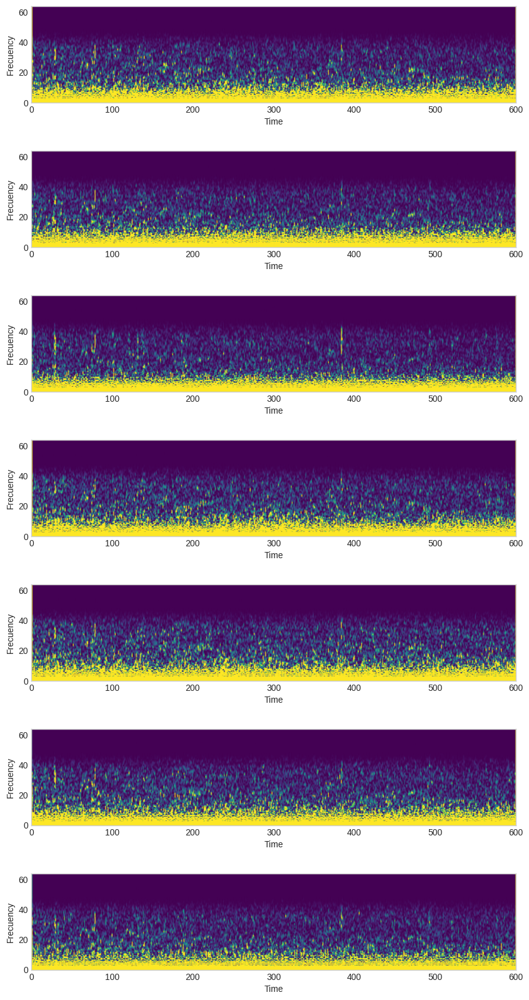

In [9]:
# Validate the power value for the focus state
fig,ax = plt.subplots(col,1)
fig.set_size_inches(10,20)
for i in range(col):
    ax[i].pcolormesh(t, f, power_focus['eeg_record3'][i,:,:],vmin=0, cmap='viridis', vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frecuency")

plt.subplots_adjust(hspace=0.5)
plt.show()

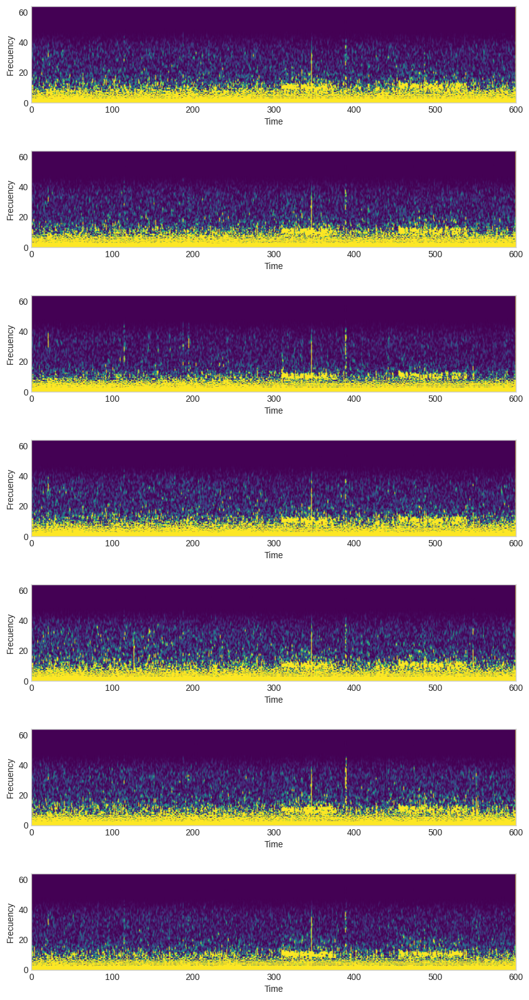

In [10]:
# Validate the power value for the unfocus state
fig,ax = plt.subplots(col,1)
fig.set_size_inches(10,20)
for i in range(col):
    ax[i].pcolormesh(t, f, power_unfocus['eeg_record3'][i,:,:],vmin=0, cmap='viridis', vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frecuency")

plt.subplots_adjust(hspace=0.5)
plt.show()

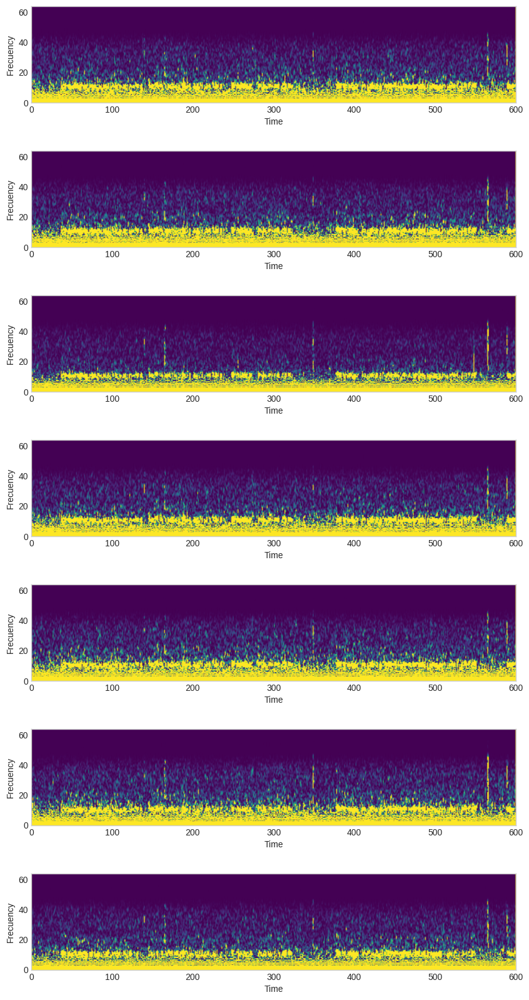

In [11]:
# Validate the power value for drowsy state
fig,ax = plt.subplots(col,1)
fig.set_size_inches(10,20)
for i in range(col):
    ax[i].pcolormesh(t, f, power_drowsy['eeg_record3'][i,:,:],vmin=0, cmap='viridis', vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frecuency")

plt.subplots_adjust(hspace=0.5)
plt.show()

Combine the power spectral density (PSD) values into bins of 0.5 Hz width while keeping the frequency range from 0 to 18 Hz.

- 7 represents the number of EEG channels.
- 36 represents the number of bins (18 Hz divided by 0.5 Hz).
- 601 represents the number of time steps 

By combining adjacent frequency bins into larger bins, the dimensionality of the data is reduced while preserving essential frequency information.

In [12]:
num=[]

power_focus_bin = {}
for name in trail_names:
    power_focus_bin[name]=np.zeros([7,36,601])
    
power_unfocus_bin = {}
for name in trail_names:
    power_unfocus_bin[name]=np.zeros([7,36,601])
    
power_drowsy_bin = {}
for name in trail_names:
    power_drowsy_bin[name]=np.zeros([7,36,601])

for name in trail_names:
    for chn in range(col):
        j=0
        for i in range(1,144,4):
            power_focus_bin[name][chn,j,:]=np.average(power_focus[name][chn,i:i+4,:],axis=0)
            power_unfocus_bin[name][chn,j,:]=np.average(power_unfocus[name][chn,i:i+4,:],axis=0)
            power_drowsy_bin[name][chn,j,:]=np.average(power_drowsy[name][chn,i:i+4,:],axis=0)
            j=j+1

print(power_focus_bin['eeg_record3'].shape)

(7, 36, 601)


Calculate the average power spectral density (PSD) values over a 15-second running window. For each time step, it calculates the average PSD values.

In [13]:
power_focus_ave = {}
for name in trail_names:
    power_focus_ave[name]=np.zeros([7,36,585])
    
power_unfocus_ave = {}
for name in trail_names:
    power_unfocus_ave[name]=np.zeros([7,36,585])
    
power_drowsy_ave = {}
for name in trail_names:
    power_drowsy_ave[name]=np.zeros([7,36,585])

for name in trail_names:
    for chn in range(col):
        j=0
        for k in range(0,585):
            power_focus_ave[name][chn,:,j]=np.average(power_focus_bin[name][chn,:,k:k+15],axis=1)
            power_unfocus_ave[name][chn,:,j]=np.average(power_unfocus_bin[name][chn,:,k:k+15],axis=1)
            power_drowsy_ave[name][chn,:,j]=np.average(power_drowsy_bin[name][chn,:,k:k+15],axis=1)
            j=j+1

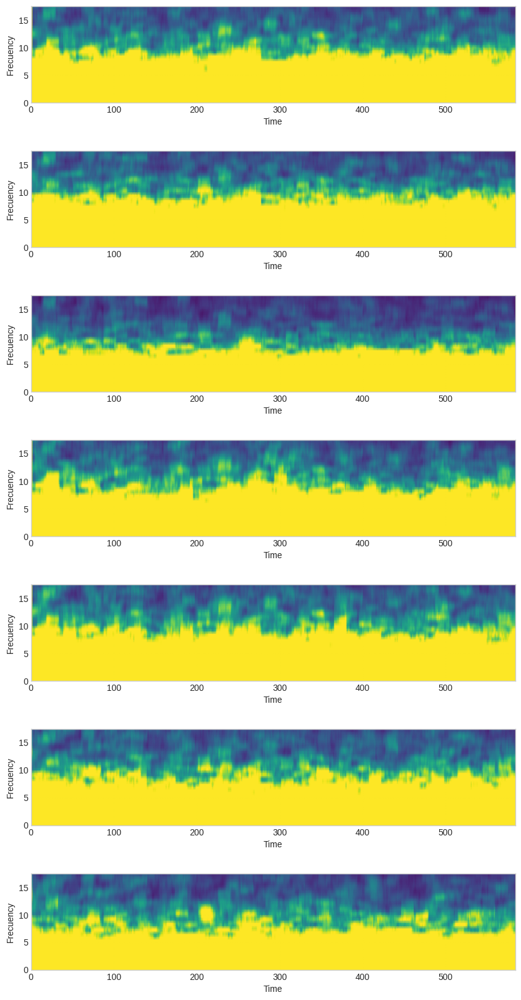

In [14]:
fig,ax = plt.subplots(col,1)
t1=np.arange(0,585)
f1=np.arange(0,18,0.5)
fig.set_size_inches(10,20)
for i in range(col):
    ax[i].pcolormesh(t1, f1, power_focus_ave['eeg_record3'][i,:,:],vmin=0, cmap='viridis', vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frecuency")

plt.subplots_adjust(hspace=0.5)
plt.show()

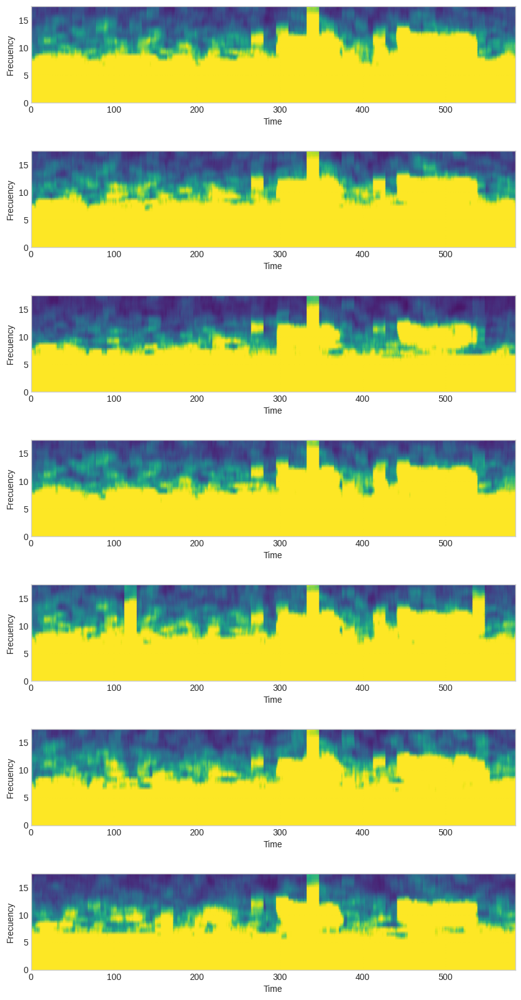

In [15]:
fig,ax = plt.subplots(col,1)
t1=np.arange(0,585)
f1=np.arange(0,18,0.5)
fig.set_size_inches(10,20)
for i in range(col):
    ax[i].pcolormesh(t1, f1, power_unfocus_ave['eeg_record3'][i,:,:],vmin=0, cmap='viridis', vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frecuency")

plt.subplots_adjust(hspace=0.5)
plt.show()

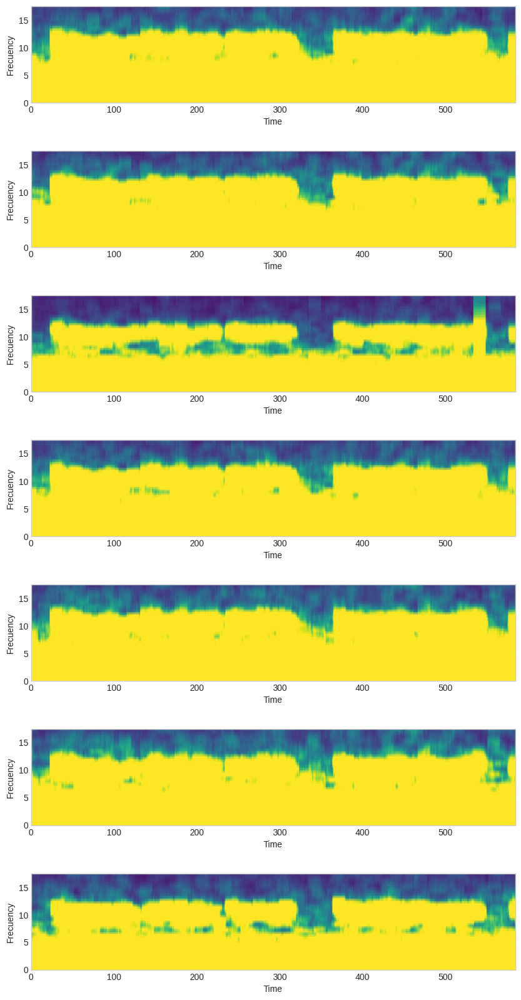

In [16]:
fig,ax = plt.subplots(col,1)
t1=np.arange(0,585)
f1=np.arange(0,18,0.5)
fig.set_size_inches(10,20)
for i in range(col):
    ax[i].pcolormesh(t1, f1, power_drowsy_ave['eeg_record3'][i,:,:],vmin=0, cmap='viridis', vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frecuency")

plt.subplots_adjust(hspace=0.5)
plt.show()

Transforms the averaged power spectral density (PSD) data into a vector format suitable for Support Vector Machine (SVM) classification.

The resulting SVM vectors have dimensions [252, 585], where:

- 252 represents the number of rows, corresponding to the number of trials.
- 585 represents the number of columns, corresponding to the number of time steps.

In [17]:
svm_focus = {}
for name in trail_names:
    svm_focus[name]=np.zeros([252,585])
    
svm_unfocus = {}
for name in trail_names:
    svm_unfocus[name]=np.zeros([252,585])
    
svm_drowsy = {}
for name in trail_names:
    svm_drowsy[name]=np.zeros([252,585])

for name in trail_names:
    for j in range(585):      
        svm_focus[name][:,j]=power_focus_ave[name][:,:,j].reshape(1,-1)
        svm_unfocus[name][:,j]=power_unfocus_ave[name][:,:,j].reshape(1,-1)
        svm_drowsy[name][:,j]=power_drowsy_ave[name][:,:,j].reshape(1,-1)
    svm_focus[name]=10*np.log(svm_focus[name])
    svm_unfocus[name]=10*np.log(svm_unfocus[name])
    svm_drowsy[name]=10*np.log(svm_drowsy[name])

svm_focus['eeg_record33'].shape

(252, 585)

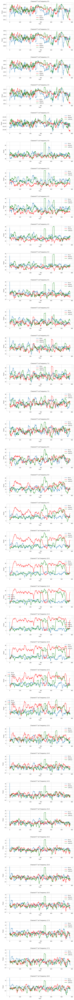

In [18]:
fig,ax = plt.subplots(36,1)
fig.set_size_inches(10,150)

for i in range(36):
    ax[i].plot(svm_focus['eeg_record3'][i,1:],label='focus')
    ax[i].plot(svm_drowsy['eeg_record3'][i,1:],c='r',label='drowsy')
    ax[i].plot(svm_unfocus['eeg_record3'][i,1:],c='green',label='unfocus')
    ax[i].legend()
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Power")
    ax[i].set_title("Channel F7 at Frequency "+ str((i+1)*0.5) )

# Adjust spacing (hspace controls vertical spacing)
plt.subplots_adjust(hspace=0.5)  # Increase value to add more margin
plt.show()

Prepare the target labels and subject data for classification.

Three lists (label_focus, label_unfocus, label_drowsy) are created, each containing 585 elements initialized with 0, 1, and 2, respectively. These labels represent the mental states: focused, unfocused, and drowsy.

The target list is populated by concatenating the label lists for each mental state (label_focus, label_unfocus, label_drowsy).

The final shape of 'subj' is (40365, 252), indicating 40365 samples with 252 features each. This implies that there are 40365 instances in the dataset, each represented by 252 features derived from the EEG data.

In [19]:
state_names = ['focus', 'unfocus', 'drowsy']

#--------0
label_focus = [0]*585
#--------1
label_unfocus = [1]*585
#--------2
label_drowsy = [2]*585

target=[]
subj=np.array([]).reshape(252,0).copy()
for name in trail_names:
    subj=np.concatenate((subj,svm_focus[name]), axis=1)
    subj=np.concatenate((subj,svm_unfocus[name]), axis=1)
    subj=np.concatenate((subj,svm_drowsy[name]), axis=1)  
    target = target+label_focus+label_unfocus+label_drowsy
subj=subj.T
target = np.array(target)

subj.shape

(40365, 252)

In [20]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

# Use a fixed random_state to ensure reproducibility
X_train, X_test, y_train, y_test = train_test_split(
    subj, target, test_size=0.2, random_state=42
)

scaler = preprocessing.StandardScaler().fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

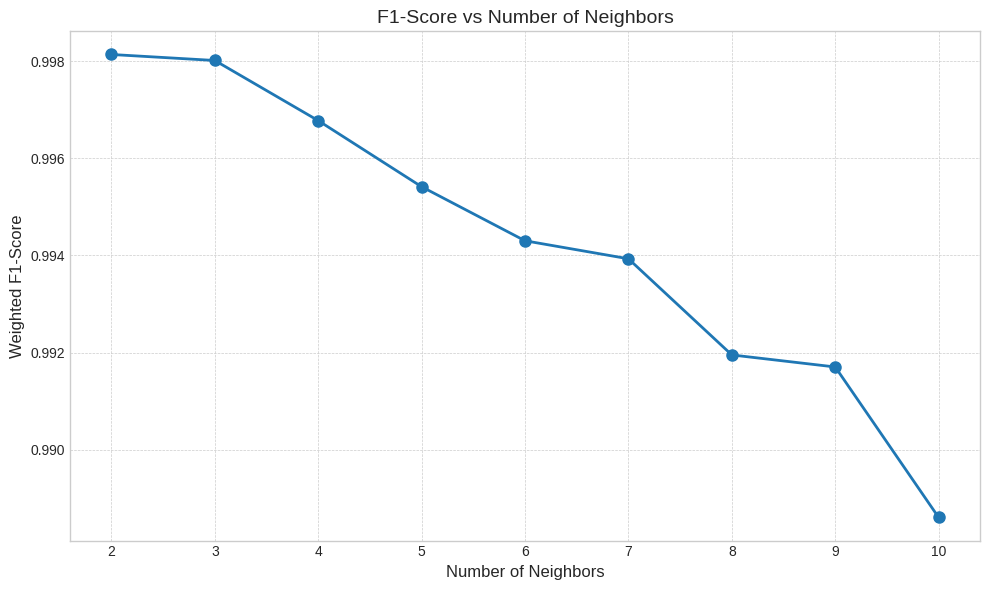

Best result:
Number of Neighbors: 2
Classification Report:
              precision    recall  f1-score      support
0              0.998892  0.999261  0.999076  2706.000000
1              0.997408  0.997039  0.997224  2702.000000
2              0.998124  0.998124  0.998124  2665.000000
accuracy       0.998142  0.998142  0.998142     0.998142
macro avg      0.998141  0.998141  0.998141  8073.000000
weighted avg   0.998142  0.998142  0.998142  8073.000000


In [ ]:
import pandas as pd
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier

neighbors = range(2, 11)
best_f1 = 0
best_neighbors = 0
classification_reports = {}
f1_scores = []

for n in neighbors:
    knn_classifier = KNeighborsClassifier(n_neighbors=n)
    knn_classifier.fit(X_train_scaled, y_train)
    predicted_labels = knn_classifier.predict(X_test_scaled)
    report = classification_report(y_test, predicted_labels, output_dict=True)
    classification_reports[n] = report
    f1 = report['weighted avg']['f1-score']
    f1_scores.append(f1)
    if f1 > best_f1:
        best_f1 = f1
        best_neighbors = n

# ------------------------
# KNN with different neighbors
# ------------------------
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(10, 6))
plt.plot(neighbors, f1_scores, marker='o', linestyle='-', linewidth=2, markersize=8, label='Weighted F1-Score')
plt.xlabel('Number of Neighbors', fontsize=12)
plt.ylabel('Weighted F1-Score', fontsize=12)
plt.title('F1-Score vs Number of Neighbors', fontsize=14)
plt.xticks(neighbors, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

print("Best result:")
print(f"Number of Neighbors: {best_neighbors}")
print("Classification Report:")
report_df = pd.DataFrame(classification_reports[best_neighbors]).transpose()
print(report_df)


Confusion Matrix:
[[2704    2    0]
 [   3 2694    5]
 [   0    5 2660]]


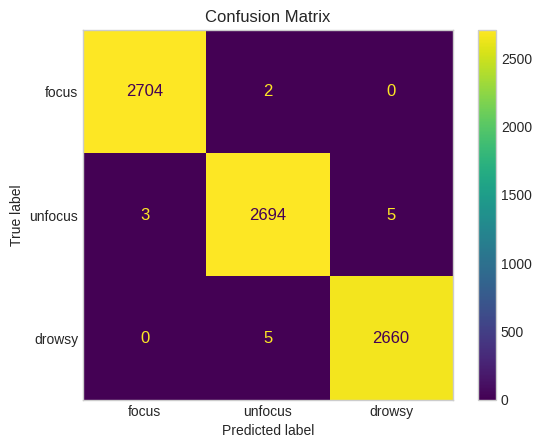

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.pipeline import make_pipeline
from joblib import dump, load

# Use the best classifier to make predictions
best_knn = KNeighborsClassifier(n_neighbors=best_neighbors)
pipe_knn = make_pipeline(
    preprocessing.StandardScaler(),
    best_knn
)
pipe_knn.fit(X_train, y_train)
dump(pipe_knn, 'pipeline/test/knn_pipeline.joblib')
y_pred_best_knn = pipe_knn.predict(X_test)

# Compute the confusion matrix
cm_knn = confusion_matrix(y_test, y_pred_best_knn)
print("Confusion Matrix:")
print(cm_knn)

# Plot the confusion matrix
disp_knn = ConfusionMatrixDisplay(confusion_matrix=cm_knn, display_labels=state_names)
disp_knn.plot(values_format='d')
disp_knn.ax_.grid(False)
for txt in disp_knn.text_.ravel():  
    txt.set_fontsize(12)
plt.title("Confusion Matrix")
plt.show()


In [ ]:
from sklearn.svm import SVC

# ------------------------
# SVM with different kernels
# ------------------------
svm_kernels = ['linear', 'poly', 'rbf', 'sigmoid']
best_svm_f1 = 0
best_kernel = None
svm_reports = {}

for kernel in svm_kernels:
    svm_clf = SVC(kernel=kernel)
    svm_clf.fit(X_train_scaled, y_train)
    svm_pred = svm_clf.predict(X_test_scaled)
    report = classification_report(y_test, svm_pred, output_dict=True)
    svm_reports[kernel] = report
    if report['weighted avg']['f1-score'] > best_svm_f1:
        best_svm_f1 = report['weighted avg']['f1-score']
        best_kernel = kernel

print("Best SVM:")
print(f"Kernel: {best_kernel}")
print(pd.DataFrame(svm_reports[best_kernel]).transpose())
print()

In [ ]:
# ------------------------
# Bar plot of weighted F1-scores for each kernel
# ------------------------
# Collect weighted F1-scores for each kernel
f1_scores = {kernel: svm_reports[kernel]['weighted avg']['f1-score'] for kernel in svm_kernels}

# Use a professional style
plt.style.use('seaborn-v0_8-whitegrid')

plt.figure(figsize=(8, 6))
bars = plt.bar(f1_scores.keys(), f1_scores.values(), width=0.5, alpha=0.8)

plt.grid(axis='x', visible=False)

plt.xlabel('Kernel', fontsize=12)
plt.ylabel('Weighted F1-Score', fontsize=12)
plt.title('SVM Kernel Performance (Weighted F1-Score)', fontsize=14, pad=20)

# Annotate each bar with its f1 score
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f'{height:.3f}',
             ha='center', va='bottom', fontsize=10)

plt.ylim(0, 1)
plt.tight_layout()
plt.show()

In [ ]:
# Use the best classifier to make predictions
best_svm = SVC(kernel=best_kernel)
pipe_svm = make_pipeline(
    preprocessing.StandardScaler(),
    best_svm
)
pipe_svm.fit(X_train, y_train)
dump(pipe_svm, 'pipeline/test/svm_pipeline.joblib')
y_pred_best_svm = pipe_svm.predict(X_test)

# Compute the confusion matrix
cm_svm = confusion_matrix(y_test, y_pred_best_svm)
print("Confusion Matrix:")
print(cm_svm)

# Plot the confusion matrix
disp_svm = ConfusionMatrixDisplay(confusion_matrix=cm_svm, display_labels=best_svm.classes_)
disp_svm.plot(values_format='d')
disp_svm.ax_.grid(False)
for txt in disp_svm.text_.ravel():  
    txt.set_fontsize(12)
plt.title("Confusion Matrix")
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# ------------------------
# Random Forest with different n_estimators
# ------------------------
rf_estimators = [10, 50, 100, 200, 500]
best_rf_f1 = 0
best_n_estimators = None
rf_reports = {}

for n in rf_estimators:
    rf_clf = RandomForestClassifier(n_estimators=n, random_state=42)
    rf_clf.fit(X_train_scaled, y_train)
    rf_pred = rf_clf.predict(X_test_scaled)
    report = classification_report(y_test, rf_pred, output_dict=True)
    rf_reports[n] = report
    if report['weighted avg']['f1-score'] > best_rf_f1:
        best_rf_f1 = report['weighted avg']['f1-score']
        best_n_estimators = n

print("Best Random Forest:")
print(f"n_estimators: {best_n_estimators}")
print(pd.DataFrame(rf_reports[best_n_estimators]).transpose())
print()

In [ ]:
# ------------------------
# Bar plot of weighted F1-scores for each n_estimators
# ------------------------
# Collect weighted F1-scores for each estimator value
f1_scores = {n: rf_reports[n]['weighted avg']['f1-score'] for n in rf_estimators}

plt.figure(figsize=(8, 6))
bars = plt.bar([str(n) for n in rf_estimators],
               [f1_scores[n] for n in rf_estimators],               
               width=0.5, alpha=0.8)
plt.grid(axis='x', visible=False)

plt.xlabel('Number of Estimators', fontsize=12)
plt.ylabel('Weighted F1-Score', fontsize=12)
plt.title('Random Forest Performance (Weighted F1-Score)', fontsize=14, pad=20)

# Annotate each bar with its F1-score
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 0.01, f'{height:.3f}',
             ha='center', va='bottom', fontsize=10)

plt.ylim(0, 1)
plt.tight_layout()
plt.show()


In [ ]:
# Use the best classifier to make predictions
best_rf = RandomForestClassifier(n_estimators=best_n_estimators, random_state=42)
pipe_rf = make_pipeline(
    preprocessing.StandardScaler(),
    best_rf
)
pipe_rf.fit(X_train, y_train)
dump(pipe_rf, 'pipeline/test/rf_pipeline.joblib')
y_pred_best_rf = pipe_rf.predict(X_test)

# Compute the confusion matrix
cm_rf = confusion_matrix(y_test, y_pred_best_rf)
print("Confusion Matrix:")
print(cm_rf)

# Plot the confusion matrix
disp_rf = ConfusionMatrixDisplay(confusion_matrix=cm_rf, display_labels=best_rf.classes_)
disp_rf.plot(values_format='d')
disp_rf.ax_.grid(False)
for txt in disp_rf.text_.ravel():  
    txt.set_fontsize(12)
plt.title("Confusion Matrix")
plt.show()

In [ ]:
from sklearn.linear_model import LogisticRegression

# ------------------------
# Logistic Regression with different C values
# ------------------------
C_values = [0.01, 0.1, 1, 10, 100]
best_lr_f1 = 0
best_C = None
lr_reports = {}

for C in C_values:
    lr_clf = LogisticRegression(C=C, max_iter=1000, random_state=42)
    lr_clf.fit(X_train_scaled, y_train)
    lr_pred = lr_clf.predict(X_test_scaled)
    report = classification_report(y_test, lr_pred, output_dict=True)
    lr_reports[C] = report
    if report['weighted avg']['f1-score'] > best_lr_f1:
        best_lr_f1 = report['weighted avg']['f1-score']
        best_C = C

print("Best Logistic Regression:")
print(f"C: {best_C}")
print(pd.DataFrame(lr_reports[best_C]).transpose())

In [ ]:
# ------------------------
# Bar plot of weighted F1-scores for different C values
# ------------------------
# Collect weighted F1-scores for each C value
f1_scores = {C: lr_reports[C]['weighted avg']['f1-score'] for C in C_values}

# Apply a professional style
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(8, 6))
bars = plt.bar([str(C) for C in C_values],
               [f1_scores[C] for C in C_values],
               width=0.5, alpha=0.8)

plt.grid(axis='x', visible=False)

plt.xlabel('C Value', fontsize=12)
plt.ylabel('Weighted F1-Score', fontsize=12)
plt.title('Logistic Regression Performance (Weighted F1-Score)', fontsize=14, pad=20)

# Annotate each bar with its F1-score
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f'{height:.3f}',
             ha='center', va='bottom', fontsize=10)

plt.ylim(0, 1)
plt.tight_layout()
plt.show()


In [ ]:
# Use the best classifier to make predictions
best_lr = LogisticRegression(C=best_C, max_iter=1000, random_state=42)
pipe_lr = make_pipeline(
    preprocessing.StandardScaler(),
    best_lr
)
pipe_lr.fit(X_train, y_train)
dump(pipe_lr, 'pipeline/test/lr_pipeline.joblib')
y_pred_best_lr = pipe_lr.predict(X_test)

# Compute the confusion matrix
cm_lr = confusion_matrix(y_test, y_pred_best_lr)
print("Confusion Matrix:")
print(cm_lr)

# Plot the confusion matrix
disp_lr = ConfusionMatrixDisplay(confusion_matrix=cm_lr, display_labels=best_lr.classes_)
disp_lr.plot(values_format='d')
disp_lr.ax_.grid(False)
for txt in disp_lr.text_.ravel():  
    txt.set_fontsize(12)
plt.title("Confusion Matrix")
plt.show()